In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install mtcnn
import os
import cv2
from mtcnn import MTCNN



def load_images_from_folder(folder):
    images = []
    valid_extensions = ('.jpg', '.png')  # Only accept these file extensions

    for filename in os.listdir(folder):
        file_ext = os.path.splitext(filename)[-1].lower()
        if file_ext in valid_extensions:
            file_path = os.path.join(folder, filename)
            img = cv2.imread(file_path)
            if img is not None:
                images.append(img)  # Keep the color images
            else:
                print(f"Could not load image: {file_path}")
    return images

def extract_faces(images):
    detector = MTCNN()
    faces = []

    for img in images:
        result = detector.detect_faces(img)
        if result:
            x, y, width, height = result[0]['box']
            face = img[y:y+height, x:x+width]
            face = cv2.resize(face, (128, 128))
            faces.append(face)

    return faces

with_glasses_images = load_images_from_folder('/content/drive/MyDrive/Untitled folder/Images/with glasses')
without_glasses_images = load_images_from_folder('/content/drive/MyDrive/Untitled folder/Images/without glasses')

with_glasses_faces = extract_faces(with_glasses_images)
without_glasses_faces = extract_faces(without_glasses_images)


Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 25ms/step


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split

# Create labels
with_glasses_labels = np.ones(len(with_glasses_faces))
without_glasses_labels = np.zeros(len(without_glasses_faces))

# Combine data and labels
X = np.array(with_glasses_faces + without_glasses_faces)
y = np.concatenate((with_glasses_labels, without_glasses_labels), axis=0)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

model = keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    layers.MaxPooling2D((2, 2)),,.,;l/'..........;;;'
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])


In [ ]:
model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/20
9/9 [==============================] - 6s 578ms/step - loss: 363.1496 - accuracy: 0.4444 - val_loss: 18.8997 - val_accuracy: 0.4706
Epoch 2/20
9/9 [==============================] - 6s 657ms/step - loss: 5.5648 - accuracy: 0.4889 - val_loss: 0.4476 - val_accuracy: 0.8529
Epoch 3/20
9/9 [==============================] - 5s 559ms/step - loss: 0.4290 - accuracy: 0.8111 - val_loss: 0.3458 - val_accuracy: 0.8676
Epoch 4/20
9/9 [==============================] - 4s 412ms/step - loss: 0.2149 - accuracy: 0.9222 - val_loss: 0.3056 - val_accuracy: 0.9118
Epoch 5/20
9/9 [==============================] - 4s 394ms/step - loss: 0.0834 - accuracy: 0.9704 - val_loss: 0.3364 - val_accuracy: 0.8971
Epoch 6/20
9/9 [==============================] - 4s 402ms/step - loss: 0.0675 - accuracy: 0.9704 - val_loss: 0.3711 - val_accuracy: 0.9118
Epoch 7/20
9/9 [==============================] - 5s 550ms/step - loss: 0.0232 - accuracy: 0.9889 - val_loss: 0.6383 - val_accuracy: 0.8676
Epoch 8/20
9/9 [=

In [ ]:
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc * 100:.2f}%")

3/3 [==============================] - 0s 68ms/step - loss: 0.6791 - accuracy: 0.9559
Test accuracy: 95.59%


3/3 [==============================] - 0s 101ms/step


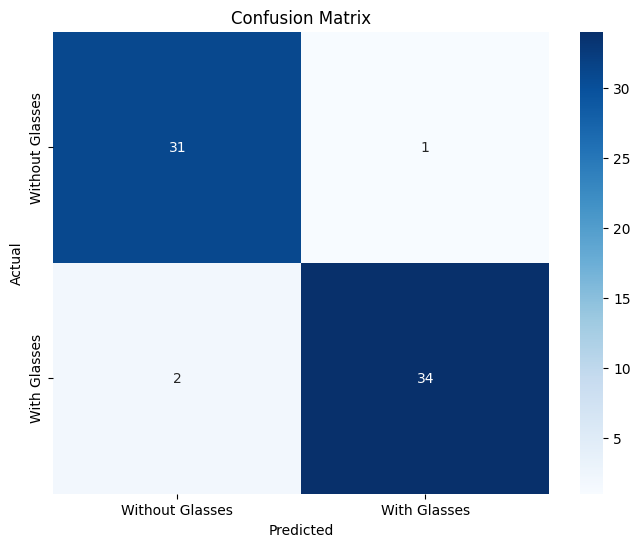

Accuracy: 95.59%
F1 Score: 0.96

Classification Report:
                 precision    recall  f1-score   support

Without Glasses       0.94      0.97      0.95        32
   With Glasses       0.97      0.94      0.96        36

       accuracy                           0.96        68
      macro avg       0.96      0.96      0.96        68
   weighted avg       0.96      0.96      0.96        68



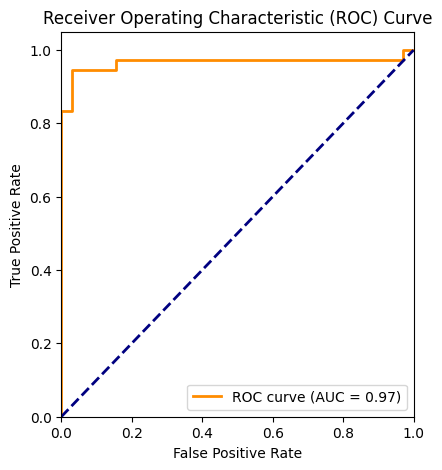

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score, f1_score, accuracy_score
from sklearn.metrics import classification_report
from sklearn.preprocessing import label_binarize
import seaborn as sns

# Predict the probabilities for the test set
y_pred_prob = model.predict(X_test)

# Calculate the binary predictions based on a threshold (e.g., 0.5)
y_pred = (y_pred_prob > 0.5).astype(int)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
# Visualize Confusion Matrix as a Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve and AUC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')


# Other Metrics
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"F1 Score: {f1:.2f}")

# Classification Report
target_names = ['Without Glasses', 'With Glasses']
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=target_names))


1/1 [==============================] - 0s 20ms/step


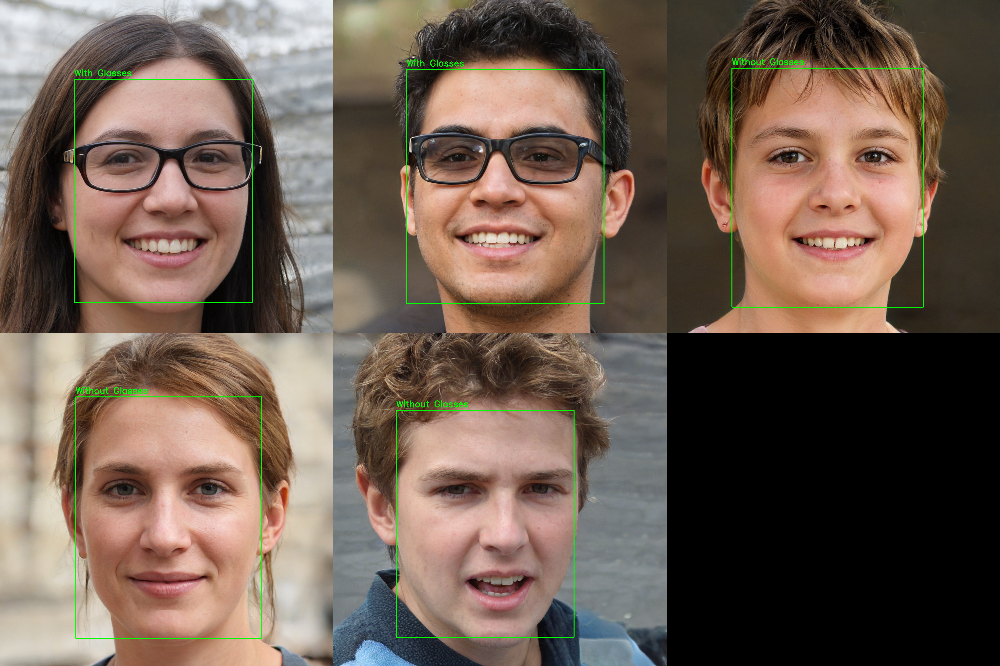

In [ ]:
from google.colab.patches import cv2_imshow

import cv2
import numpy as np
from mtcnn import MTCNN
import tensorflow as tf
from tensorflow import keras

# Load your trained model
model = keras.models.load_model('/content/drive/MyDrive/glasses_detection_model.h5')

# Define a function to predict if a person is wearing glasses
def predict_glasses(face, model):
    face = cv2.resize(face, (128, 128))
    face = np.expand_dims(face, axis=0)  # Add batch dimension
    prediction = model.predict(face)

    # Display prediction
    if prediction[0][0] > 0.5:  # Assuming 0.5 as the threshold for wearing glasses
        return 'With Glasses'
    else:
        return 'Without Glasses'

# Load different pictures of yourself
image_paths = ['/content/drive/MyDrive/Untitled folder/Images/face-15.png',
               '/content/drive/MyDrive/Untitled folder/Images/face-17.png',
               '/content/drive/MyDrive/Untitled folder/Images/face-26.png',
               '/content/drive/MyDrive/Untitled folder/Images/face-4.png',
               '/content/drive/MyDrive/Untitled folder/Images/face-5.png']

# Initialize the MTCNN detector
mtcnn_detector = MTCNN()

classified_images = []

for image_path in image_paths:
    # Read the image
    img = cv2.imread(image_path)

    # Detect faces in the image using MTCNN
    result = mtcnn_detector.detect_faces(img)

    if result:
        x, y, width, height = result[0]['box']
        face = img[y:y+height, x:x+width]
        prediction = predict_glasses(face, model)

        # Display the result
        cv2.rectangle(img, (x, y), (x+width, y+height), (0, 255, 0), 2)  # Green rectangle
        cv2.putText(img, prediction, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

        classified_images.append(img)

# Determine the number of rows and columns for the display
num_images = len(classified_images)
num_columns = 3
num_rows = (num_images + num_columns - 1) // num_columns  # Round up

# Calculate the size of the final display image
image_height, image_width, _ = classified_images[0].shape
final_image_height = num_rows * image_height
final_image_width = num_columns * image_width
final_image = np.zeros((final_image_height, final_image_width, 3), dtype=np.uint8)

# Create the final image by arranging the classified images in rows of 3
for i, img in enumerate(classified_images):
    row = i // num_columns
    col = i % num_columns
    final_image[row * image_height:(row + 1) * image_height, col * image_width:(col + 1) * image_width, :] = img

# Display the final image
cv2_imshow(final_image)
cv2.waitKey(0)

# Close the OpenCV window
cv2.destroyAllWindows()


1/1 [==============================] - 0s 19ms/step


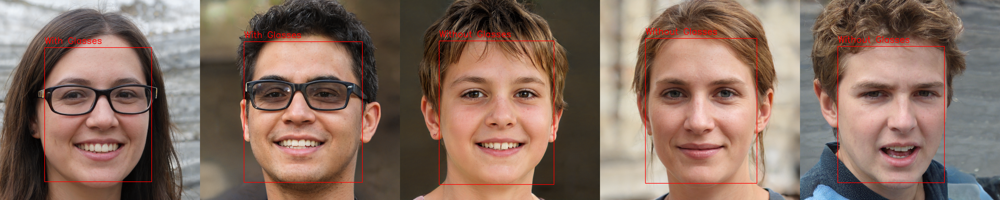

In [ ]:
from google.colab.patches import cv2_imshow

import cv2
import numpy as np
from mtcnn import MTCNN
import tensorflow as tf
from tensorflow import keras

# Load your trained model
model = keras.models.load_model('/content/drive/MyDrive/glasses_detection_model.h5')

# Define a function to predict if a person is wearing glasses
def predict_glasses(face, model):
    face = cv2.resize(face, (128, 128))
    face = np.expand_dims(face, axis=0)  # Add batch dimension
    prediction = model.predict(face)

    # Display prediction
    if prediction[0][0] > 0.5:  # Assuming 0.5 as the threshold for wearing glasses
        return 'With Glasses'
    else:
        return 'Without Glasses'

# Load different pictures of yourself
image_paths = ['/content/drive/MyDrive/Untitled folder/Images/face-15.png','/content/drive/MyDrive/Untitled folder/Images/face-17.png','/content/drive/MyDrive/Untitled folder/Images/face-26.png','/content/drive/MyDrive/Untitled folder/Images/face-4.png','/content/drive/MyDrive/Untitled folder/Images/face-5.png']

# Initialize the MTCNN detector
mtcnn_detector = MTCNN()

classified_images = []

for image_path in image_paths:
    # Read the image
    img = cv2.imread(image_path)

    # Detect faces in the image using MTCNN
    result = mtcnn_detector.detect_faces(img)

    if result:
        x, y, width, height = result[0]['box']
        face = img[y:y+height, x:x+width]
        prediction = predict_glasses(face, model)

        # Display the result
        cv2.rectangle(img, (x, y), (x+width, y+height), (0, 0, 255), 2)  # Red rectangle
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img, prediction, (x, y - 20), font, 1.5, (0, 0, 255), 2, cv2.LINE_AA)  # Larger and bold text

        classified_images.append(img)

# Calculate the size of the final display image
num_images = len(classified_images)
image_height, image_width, _ = classified_images[0].shape
final_image = np.zeros((image_height, image_width * num_images, 3), dtype=np.uint8)

# Concatenate the classified images side by side
for i, img in enumerate(classified_images):
    final_image[:, i * image_width:(i + 1) * image_width, :] = img

# Display the final image
cv2_imshow(final_image)
cv2.waitKey(0)

# Close the OpenCV window
cv2.destroyAllWindows()
